# Description Of DataSet

The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset. 


There is total 

DateTime column = 2

float64 column = 9

int64 column = 18

object column = 9

total numerical columns (continuous / categorical ) = 21

# Exploratory Data Analysis (EDA)

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")

In [4]:
df.shape

(3998, 38)

In [5]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 38 columns):
ID                       3998 non-null int64
Salary                   3998 non-null int64
DOJ                      3998 non-null datetime64[ns]
DOL                      3998 non-null object
Designation              3998 non-null object
JobCity                  3998 non-null object
Gender                   3998 non-null object
DOB                      3998 non-null datetime64[ns]
10percentage             3998 non-null float64
10board                  3998 non-null object
12graduation             3998 non-null int64
12percentage             3998 non-null float64
12board                  3998 non-null object
CollegeID                3998 non-null int64
CollegeTier              3998 non-null int64
Degree                   3998 non-null object
Specialization           3998 non-null object
collegeGPA               3998 non-null float64
CollegeCityID            3998 non-null int64
Colleg

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,3998.0,663794.540520,363218.245829,11244.0000,334284.250000,639600.000000,990480.000000,1.298275e+06
Salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
CollegeID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeTier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
CollegeCityID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeCityTier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00


# Find Outliers in numerical column

In [8]:
q1 = df.quantile(0.25)
q3 = df.quantile(0.75)
iqr = q3-q1
print(iqr)

ID                       656195.750000
Salary                   190000.000000
10percentage                 13.990000
12graduation                  2.000000
12percentage                 16.600000
CollegeID                  8324.000000
CollegeTier                   0.000000
collegeGPA                    9.920000
CollegeCityID              8324.000000
CollegeCityTier               1.000000
GraduationYear                2.000000
English                     145.000000
Logical                     120.000000
Quant                       165.000000
Domain                        0.499933
ComputerProgramming         200.000000
ElectronicsAndSemicon       234.000000
ComputerScience               0.000000
MechanicalEngg                0.000000
ElectricalEngg                0.000000
TelecomEngg                   0.000000
CivilEngg                     0.000000
conscientiousness             1.416225
agreeableness                 1.099900
extraversion                  1.276800
nueroticism              

In [9]:
n = ['int64', 'float64']
numerical_column = df.select_dtypes(n)
numerical_column.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 27 columns):
ID                       3998 non-null int64
Salary                   3998 non-null int64
10percentage             3998 non-null float64
12graduation             3998 non-null int64
12percentage             3998 non-null float64
CollegeID                3998 non-null int64
CollegeTier              3998 non-null int64
collegeGPA               3998 non-null float64
CollegeCityID            3998 non-null int64
CollegeCityTier          3998 non-null int64
GraduationYear           3998 non-null int64
English                  3998 non-null int64
Logical                  3998 non-null int64
Quant                    3998 non-null int64
Domain                   3998 non-null float64
ComputerProgramming      3998 non-null int64
ElectronicsAndSemicon    3998 non-null int64
ComputerScience          3998 non-null int64
MechanicalEngg           3998 non-null int64
ElectricalEngg           3998 

In [10]:
df_outlier = (numerical_column < (q1 - 1.5 * iqr)) |(numerical_column > (q3 + 1.5 * iqr))

In [11]:
df_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 27 columns):
ID                       3998 non-null bool
Salary                   3998 non-null bool
10percentage             3998 non-null bool
12graduation             3998 non-null bool
12percentage             3998 non-null bool
CollegeID                3998 non-null bool
CollegeTier              3998 non-null bool
collegeGPA               3998 non-null bool
CollegeCityID            3998 non-null bool
CollegeCityTier          3998 non-null bool
GraduationYear           3998 non-null bool
English                  3998 non-null bool
Logical                  3998 non-null bool
Quant                    3998 non-null bool
Domain                   3998 non-null bool
ComputerProgramming      3998 non-null bool
ElectronicsAndSemicon    3998 non-null bool
ComputerScience          3998 non-null bool
MechanicalEngg           3998 non-null bool
ElectricalEngg           3998 non-null bool
TelecomEngg  

## For ID Column

In [12]:
df_outlier.loc[df_outlier['ID']==True].shape

(0, 27)

#### Their is 0 rows so there is no outliers in ID column

## For Salary Column

In [13]:
df_outlier.loc[df_outlier['Salary']==True].shape

(109, 27)

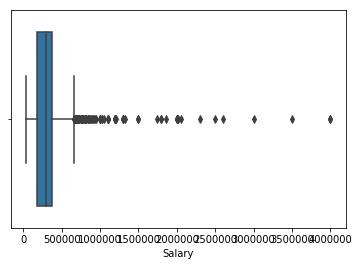

In [14]:
sns.boxplot(df['Salary'])

#### There is 109 outliers present in Salary Column

## For 10percentage column

In [15]:
df_outlier.loc[df_outlier['10percentage']==True].shape

(30, 27)

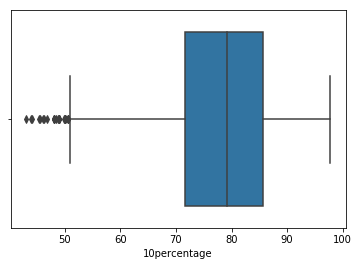

In [16]:
sns.boxplot(df['10percentage'])

#### There is 109 outliers present in this Column

## For 12graduation column

In [17]:
df_outlier.loc[df_outlier['12graduation']==True].shape

(45, 27)

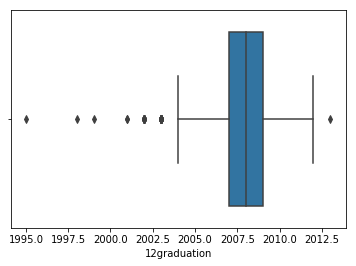

In [18]:
sns.boxplot(df['12graduation'])

##### There is 45 outliers present in this Column

## For 12percentage Column

In [19]:
df_outlier.loc[df_outlier['12percentage']==True].shape

(1, 27)

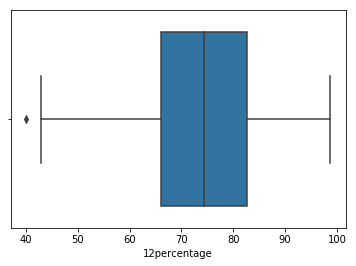

In [20]:
sns.boxplot(df['12percentage'])

##### There is 1 outliers present in this Column

## For CollegeId column

In [21]:
df_outlier.loc[df_outlier['CollegeID']==True].shape

(0, 27)

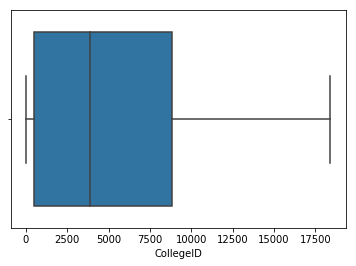

In [22]:
sns.boxplot(df['CollegeID'])

##### No outliers in this column

## For CollegeGPA column

In [23]:
df_outlier.loc[df_outlier['collegeGPA']==True].shape

(38, 27)

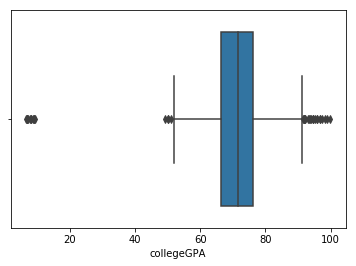

In [24]:
sns.boxplot(df['collegeGPA'])

##### Outliers present in this column

## For CollegeCityID column

In [25]:
df_outlier.loc[df_outlier['CollegeCityID']==True].shape

(0, 27)

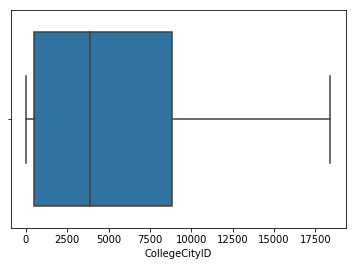

In [26]:
sns.boxplot(df['CollegeCityID'])

##### No outlier in this column

## For English column

In [27]:
df_outlier.loc[df_outlier['English']==True].shape

(15, 27)

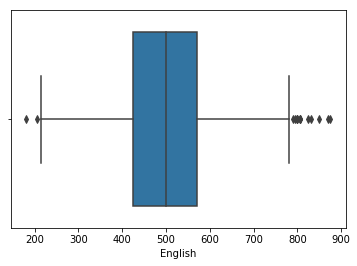

In [28]:
sns.boxplot(df['English'])

##### Outliers present in this column

## For Logical column

In [29]:
df_outlier.loc[df_outlier['Logical']==True].shape

(18, 27)

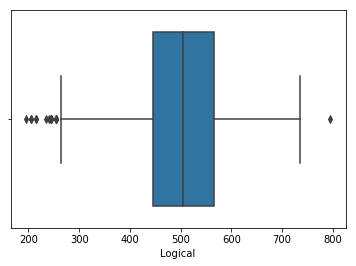

In [30]:
sns.boxplot(df['Logical'])

##### Outliers present in this column

## For Quant column

In [31]:
df_outlier.loc[df_outlier['Quant']==True].shape

(25, 27)

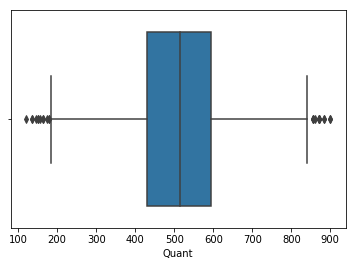

In [32]:
sns.boxplot(df['Quant'])

##### Outliers present in this column

## For Domain column

In [33]:
df_outlier.loc[df_outlier['Domain']==True].shape

(246, 27)

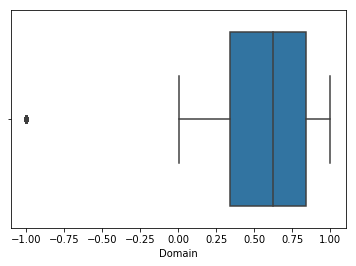

In [34]:
sns.boxplot(df['Domain'])

##### Outliers present in this column

## For ComputerProgramming column

In [35]:
df_outlier.loc[df_outlier['ComputerProgramming']==True].shape

(2, 27)

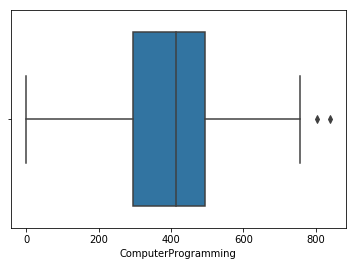

In [36]:
sns.boxplot(df['ComputerProgramming'])

##### Outliers present in this column

## For ElectronicsAndSemicon column

In [37]:
df_outlier.loc[df_outlier['ElectronicsAndSemicon']==True].shape

(2, 27)

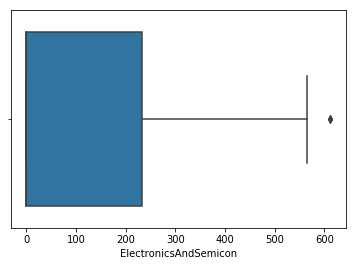

In [38]:
sns.boxplot(df['ElectronicsAndSemicon'])

##### Outliers present in this column

## For conscientiousness column

In [39]:
df_outlier.loc[df_outlier['conscientiousness']==True].shape

(39, 27)

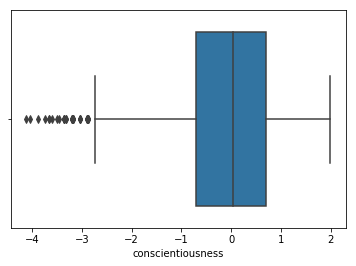

In [40]:
sns.boxplot(df['conscientiousness'])

##### Outliers present in this column

## For agreeableness column

In [41]:
df_outlier.loc[df_outlier['agreeableness']==True].shape

(123, 27)

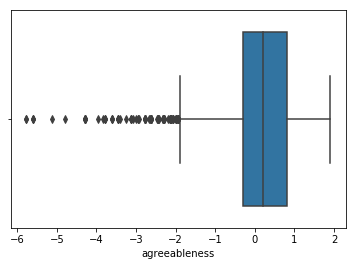

In [42]:
sns.boxplot(df['agreeableness'])

##### Outliers present in this column

## For extraversion column

In [43]:
df_outlier.loc[df_outlier['extraversion']==True].shape

(40, 27)

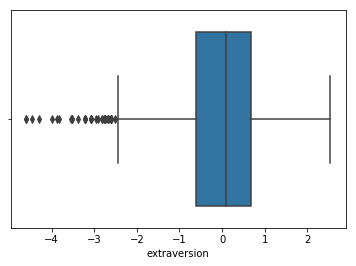

In [44]:
sns.boxplot(df['extraversion'])

##### Outliers present in this column

## For nueroticism column

In [45]:
df_outlier.loc[df_outlier['nueroticism']==True].shape

(15, 27)

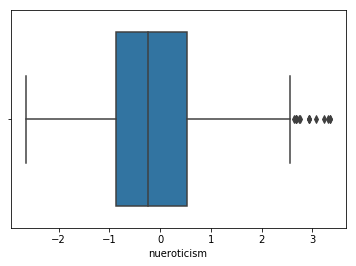

In [46]:
sns.boxplot(df['nueroticism'])

##### Outliers present in this column

## For openess_to_experience column

In [47]:
df_outlier.loc[df_outlier['openess_to_experience']==True].shape

(95, 27)

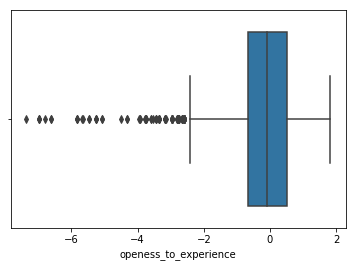

In [48]:
sns.boxplot(df['openess_to_experience'])

##### Outliers present in this column

## Understand the probability and frequency distribution of each numerical column


#### For ID Column

C:\Users\vaibhav jangid\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


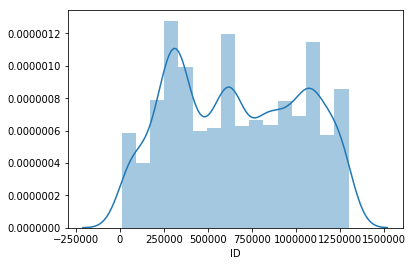

In [49]:
sns.distplot(df['ID'],kde=True)

their is good probability and frequency distribution in range 0 to 1250000

#### For Salary Column

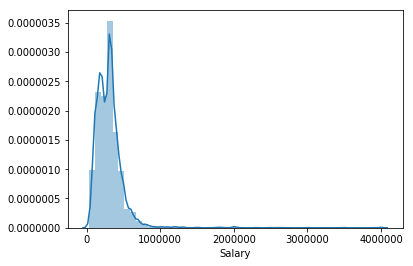

In [50]:
sns.distplot(df['Salary'],kde=True)

their is perfect probability and frequency distribution in range 0 to 100000

#### For 10percentage Column

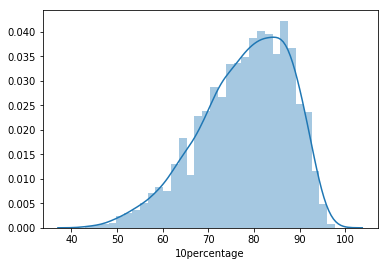

In [51]:
sns.distplot(df['10percentage'],kde=True)

their is perfect probability and frequency distribution in range 40 to 100

#### For 12graduation Column

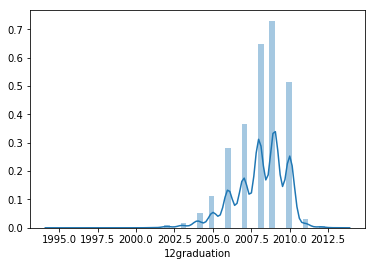

In [52]:
sns.distplot(df['12graduation'],kde=True)

not good probability and frequency distribution 

#### For 12percentage Column

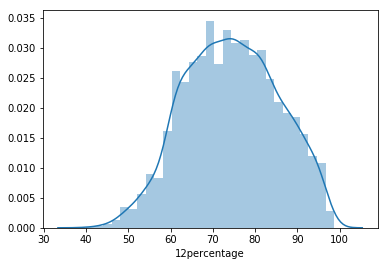

In [53]:
sns.distplot(df['12percentage'],kde=True)

their is good probability and frequency distribution in range 40 to 100

#### For CollegeID Column

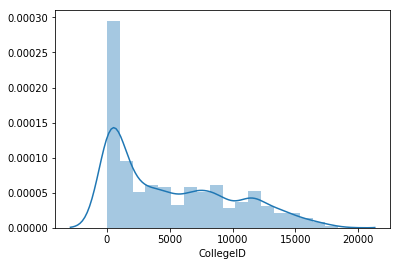

In [54]:
sns.distplot(df['CollegeID'],kde=True)

their is good probability and frequency distribution in range 0 to 20000 with outliers

#### CollegeGPA Column

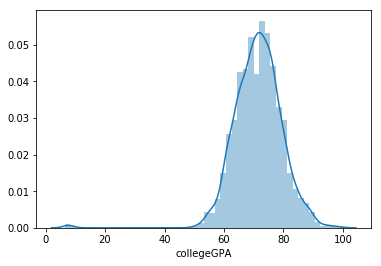

In [55]:
sns.distplot(df['collegeGPA'],kde=True)

their is perfect probability and frequency distribution in range 50 to 90

#### CollegeCityID Column

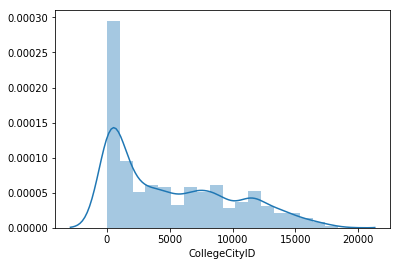

In [56]:
sns.distplot(df['CollegeCityID'],kde=True)

their is good probability and frequency distribution in range 0 to 20000

#### GraduationYear Column

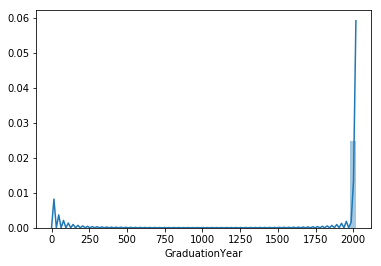

In [57]:
sns.distplot(df['GraduationYear'],kde=True)

not good probability and frequency distribution

#### English Column

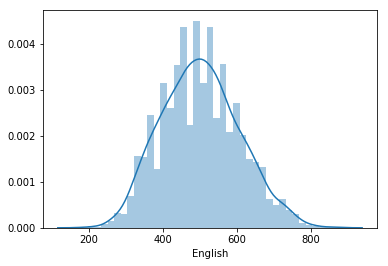

In [58]:
sns.distplot(df['English'],kde=True)

their is good probability and frequency distribution in range 200 to 800 with outliers

#### Logical Column

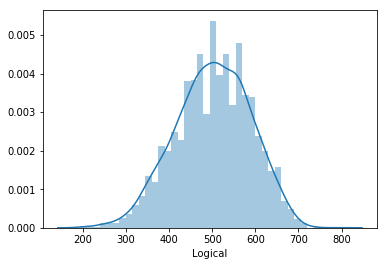

In [59]:
sns.distplot(df['Logical'],kde=True)

their is good probability and frequency distribution in range 200 to 800 with outliers

#### Quant Column

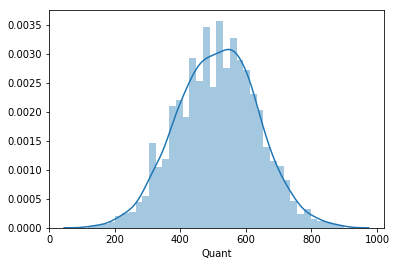

In [60]:
sns.distplot(df['Quant'],kde=True)

their is good probability and frequency distribution in range 200 to 800 with outliers

#### Domain Column

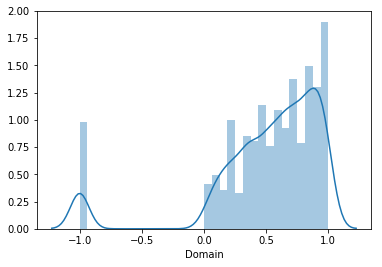

In [61]:
sns.distplot(df['Domain'],kde=True)

their is probability and frequency distribution with outliers

#### ComputerProgramming Column

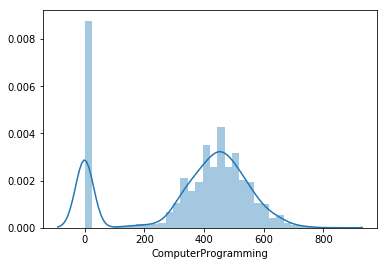

In [62]:
sns.distplot(df['ComputerProgramming'],kde=True)

their is good probability and frequency distribution in range 200 to 800 with outliers

#### ElectronicsAndSemicon Column

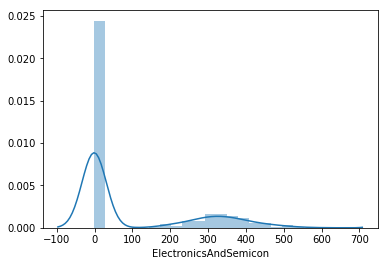

In [63]:
sns.distplot(df['ElectronicsAndSemicon'],kde=True)

their is good probability and frequency distribution in range 200 to 500 with outliers

#### conscientiousness Column

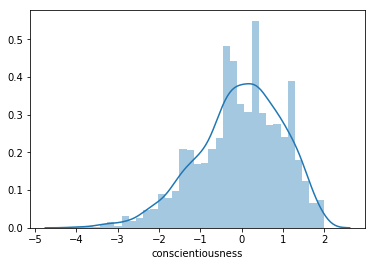

In [64]:
sns.distplot(df['conscientiousness'],kde=True)

their is perfect probability and frequency distribution in range -4 to 2 with outliers

#### agreeableness Column

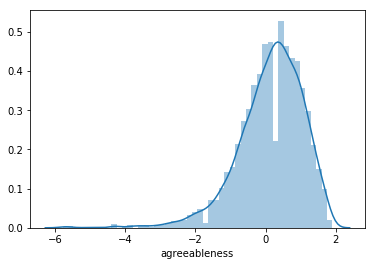

In [65]:
sns.distplot(df['agreeableness'],kde=True)

their is perfect probability and frequency distribution

#### extraversion Column

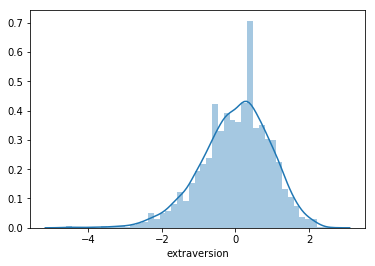

In [66]:
sns.distplot(df['extraversion'],kde=True)

their is perfect probability and frequency distribution

#### nueroticism Column

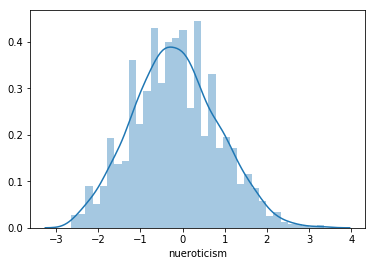

In [67]:
sns.distplot(df['nueroticism'],kde=True)

their is good probability and frequency distribution

#### openess_to_experience Column

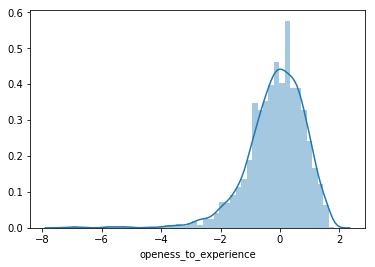

In [68]:
sns.distplot(df['openess_to_experience'],kde=True)

their is perfect probability and frequency distribution

## Understand the frequency distribution of each categorical Variable/Column

#### For Designation Column

In [69]:
x = df['Designation'].value_counts()

In [70]:
x.shape

(419,)

In [71]:
x.head()

software engineer     539
software developer    265
system engineer       205
programmer analyst    139
systems engineer      118
Name: Designation, dtype: int64

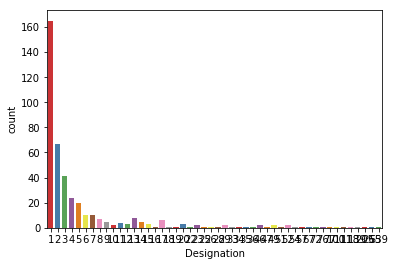

In [72]:
sns.countplot(x,palette="Set1")

###### Their is total 419 category and freq distribution is shown above 

#### For JobCity column

In [73]:
x = df['JobCity'].value_counts()

In [74]:
x.shape

(339,)

In [75]:
x.head()

Bangalore    627
-1           461
Noida        368
Hyderabad    335
Pune         290
Name: JobCity, dtype: int64

In [76]:
x.tail()

jAipur       1
GURGOAN      1
Punchkula    1
Mohali       1
Bankura      1
Name: JobCity, dtype: int64

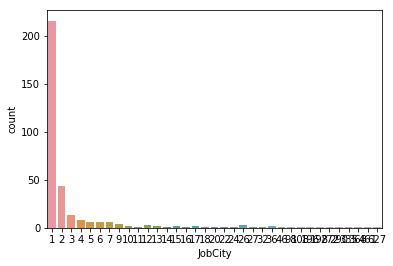

In [77]:
sns.countplot(x)

###### Their is total 339 category and freq distribution is shown above

#### For Gender column

In [78]:
x = df['Gender'].value_counts()

In [79]:
x

m    3041
f     957
Name: Gender, dtype: int64

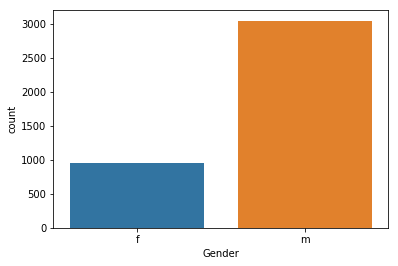

In [80]:
sns.countplot(df['Gender'])

###### Male = 3041 , Female = 957

#### For CollegeTier Column

In [81]:
x = df['CollegeTier'].value_counts()

In [82]:
x

2    3701
1     297
Name: CollegeTier, dtype: int64

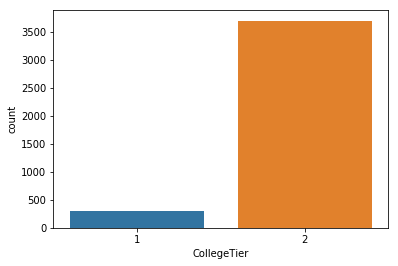

In [83]:
sns.countplot(df['CollegeTier'])

###### tier1 = 297  , tier2 = 3701 

#### For Degree Column

In [84]:
x = df['Degree'].value_counts()

In [85]:
x

B.Tech/B.E.      3700
MCA               243
M.Tech./M.E.       53
M.Sc. (Tech.)       2
Name: Degree, dtype: int64

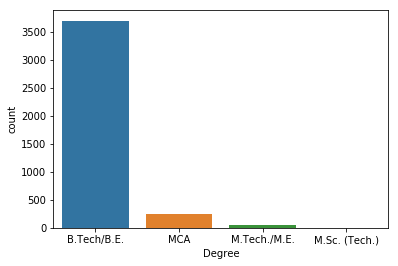

In [86]:
sns.countplot(df['Degree'])

###### Freq distribution of this is column is :- B.Tech/B.E = 3700 , MCA = 243 , M.Tech./M.E. = 53 , M.Sc. (Tech.) = 2

#### For Specialization Column

In [87]:
x = df['Specialization'].value_counts()

In [88]:
x

electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
chemical engineering                             9
applied electronics and instrum

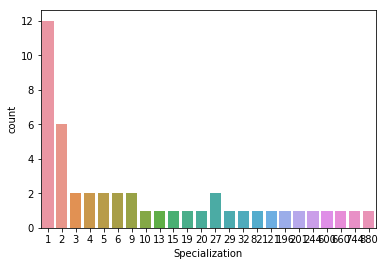

In [89]:
sns.countplot(x)

###### Freq Dist is shown above

#### For CollegeCityTier Column

In [90]:
x = df['CollegeCityTier'].value_counts()

In [91]:
x

0    2797
1    1201
Name: CollegeCityTier, dtype: int64

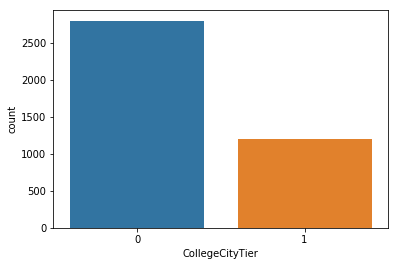

In [92]:
sns.countplot(df['CollegeCityTier'])

###### Observation -:  0 =  2797  ,  1  =  1201

#### For CollegeState Column

In [93]:
x = df['CollegeState'].value_counts()

In [94]:
x

Uttar Pradesh        915
Karnataka            370
Tamil Nadu           367
Telangana            319
Maharashtra          262
Andhra Pradesh       225
West Bengal          196
Punjab               193
Madhya Pradesh       189
Haryana              180
Rajasthan            174
Orissa               172
Delhi                162
Uttarakhand          113
Kerala                33
Jharkhand             28
Chhattisgarh          27
Gujarat               24
Himachal Pradesh      16
Bihar                 10
Jammu and Kashmir      7
Union Territory        5
Assam                  5
Sikkim                 3
Meghalaya              2
Goa                    1
Name: CollegeState, dtype: int64

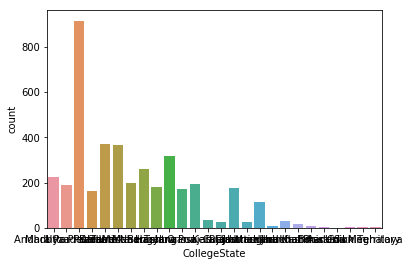

In [95]:
sns.countplot(df['CollegeState'])

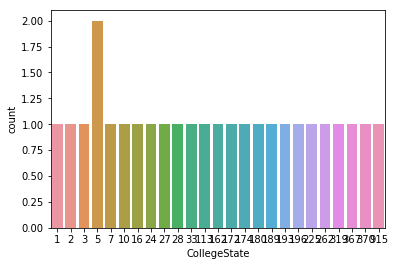

In [96]:
sns.countplot(x)

# Bivariate Analysis

## Discover the relationships between numerical columns

In [97]:
numerical_column.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 27 columns):
ID                       3998 non-null int64
Salary                   3998 non-null int64
10percentage             3998 non-null float64
12graduation             3998 non-null int64
12percentage             3998 non-null float64
CollegeID                3998 non-null int64
CollegeTier              3998 non-null int64
collegeGPA               3998 non-null float64
CollegeCityID            3998 non-null int64
CollegeCityTier          3998 non-null int64
GraduationYear           3998 non-null int64
English                  3998 non-null int64
Logical                  3998 non-null int64
Quant                    3998 non-null int64
Domain                   3998 non-null float64
ComputerProgramming      3998 non-null int64
ElectronicsAndSemicon    3998 non-null int64
ComputerScience          3998 non-null int64
MechanicalEngg           3998 non-null int64
ElectricalEngg           3998 

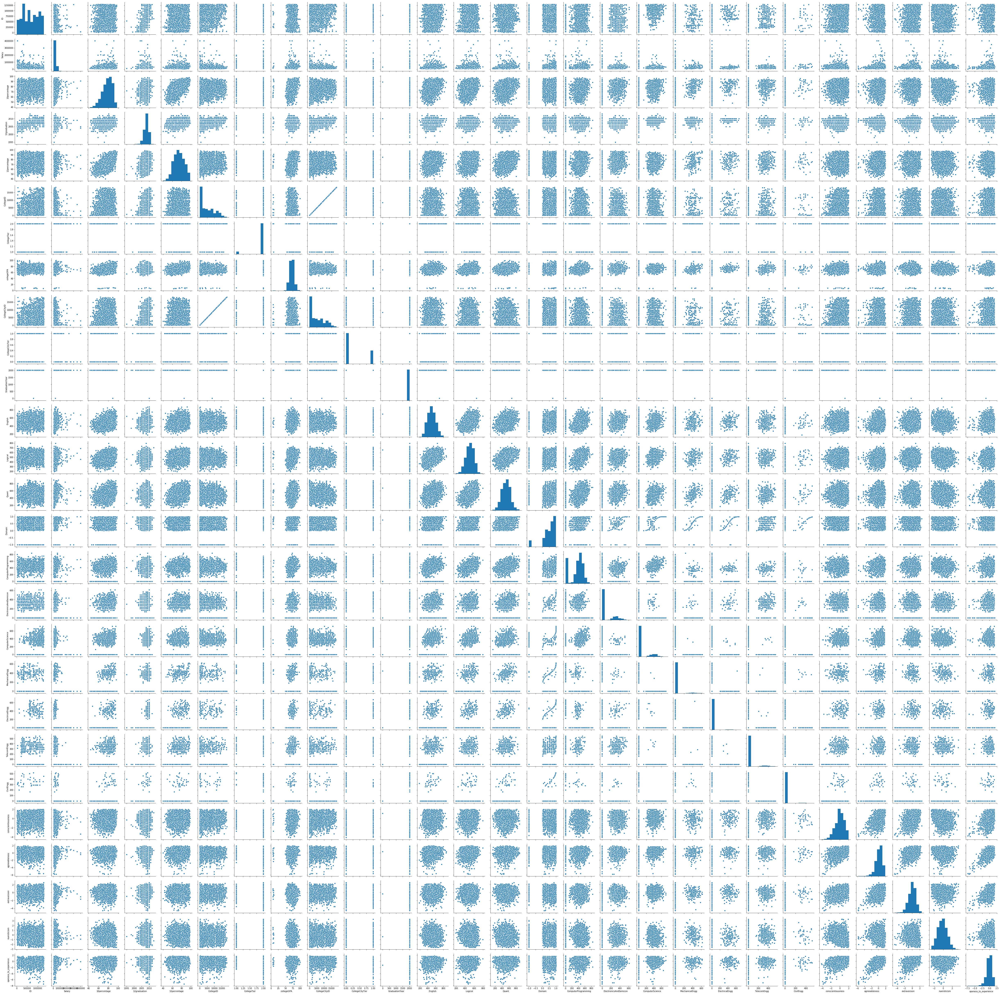

In [98]:
sns.pairplot(numerical_column)

In [99]:
corr = numerical_column.corr()

In [100]:
corr.T

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.284540,0.035160,0.047144,0.284540,-0.035977,...,0.482626,-0.026147,0.104454,-0.049272,-0.017871,0.175557,0.024837,0.120979,-0.146289,0.031359
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.118690,-0.179332,0.130103,-0.118690,0.015384,...,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,0.021082,-0.126042,0.312538,0.021082,0.116707,...,-0.018933,0.050364,0.074419,0.049378,0.030002,0.067657,0.136645,-0.004679,-0.132496,0.036692
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.254021,0.027691,0.086001,0.254021,-0.003016,...,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,0.022336,-0.100771,0.346137,0.022336,0.130462,...,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
CollegeID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,0.067054,1.000000,-0.086781,0.067054,-0.101494,...,0.001053,-0.021548,0.002594,0.000007,-0.033722,0.055174,-0.038055,0.009970,0.023778,-0.019179
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,0.017240,-0.086781,1.000000,0.017240,0.017471,...,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
CollegeCityID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,0.007757,-0.101494,0.017471,0.007757,1.000000,...,-0.010643,-0.052395,0.010311,0.049876,-0.033392,0.014763,0.005565,-0.008203,0.004442,-0.016790


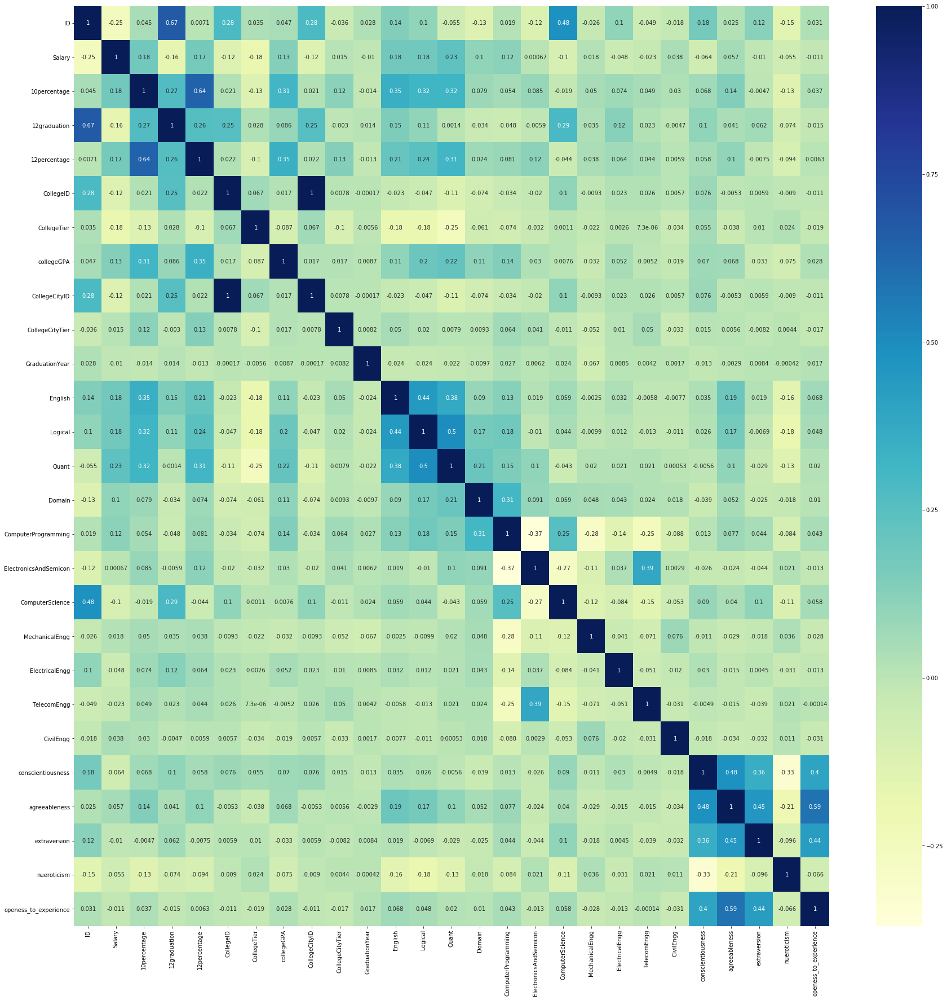

In [101]:
plt.figure(figsize=(30,30))

# heatmap
sns.heatmap(corr, cmap="YlGnBu", annot=True)
plt.show()

In [102]:
corr.columns

Index(['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

##### Observation -: 

1) conscientiousness is highly positive correlated with agreeableness, extraversion, openess_to_experience

2) ID has negative correlation with Salary, CollegeCityTier, Quant, Domain, ElectronicsAndSemicon, MechanicalEngg, TelecomEngg, CivilEngg, nueroticism

3) ID is highly positive correlated with 12graduation, ComputerScience

4) Salary is negative correlated with ID, 12graduation, CollegeID, CollegeTier, GraduationYear

5) Many columns are highly correlated that are 10percentage, 12percentage, CollegeCityID, CollegeID, TelecomEngg, ComputerScience

# Identify the patterns between categorical and numerical columns

#### For Gender Column

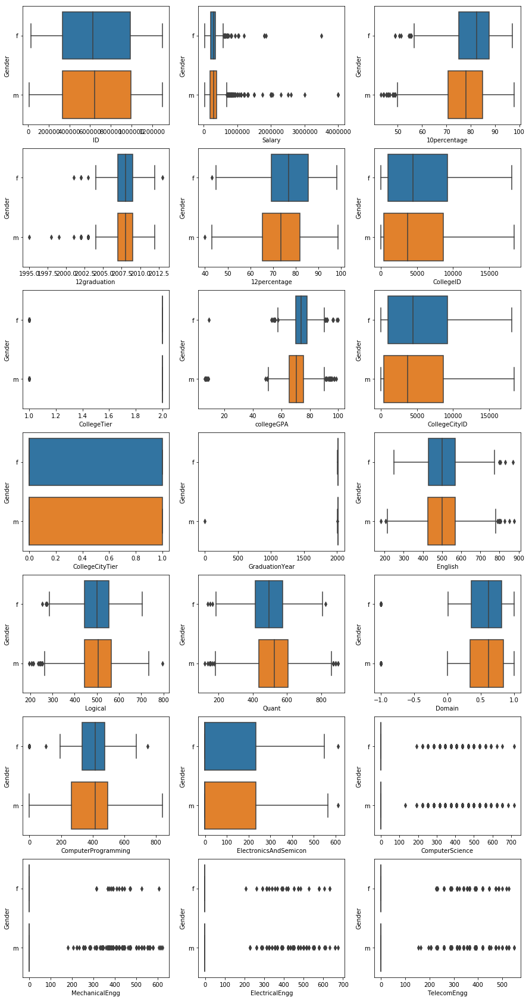

In [103]:
fig, ax = plt.subplots(7, 3, figsize=(15, 30))
for i, subplot in zip(numerical_column.columns, ax.flatten()):
    sns.boxplot(x=df[i],y=df['Gender'],ax=subplot)

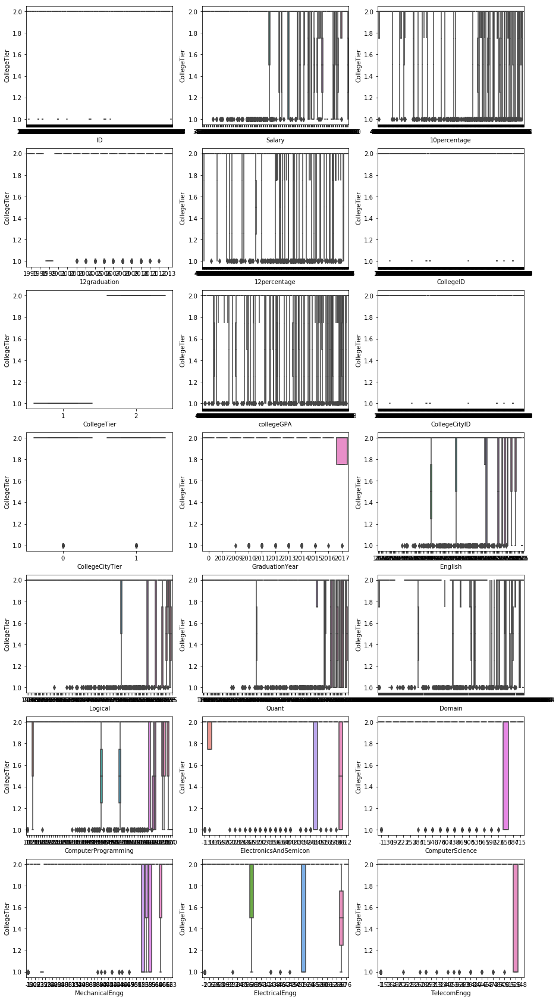

In [104]:
fig, ax = plt.subplots(7, 3, figsize=(15, 30))
for i, subplot in zip(numerical_column.columns, ax.flatten()):
    sns.boxplot(x=df[i],y=df['CollegeTier'],ax=subplot)

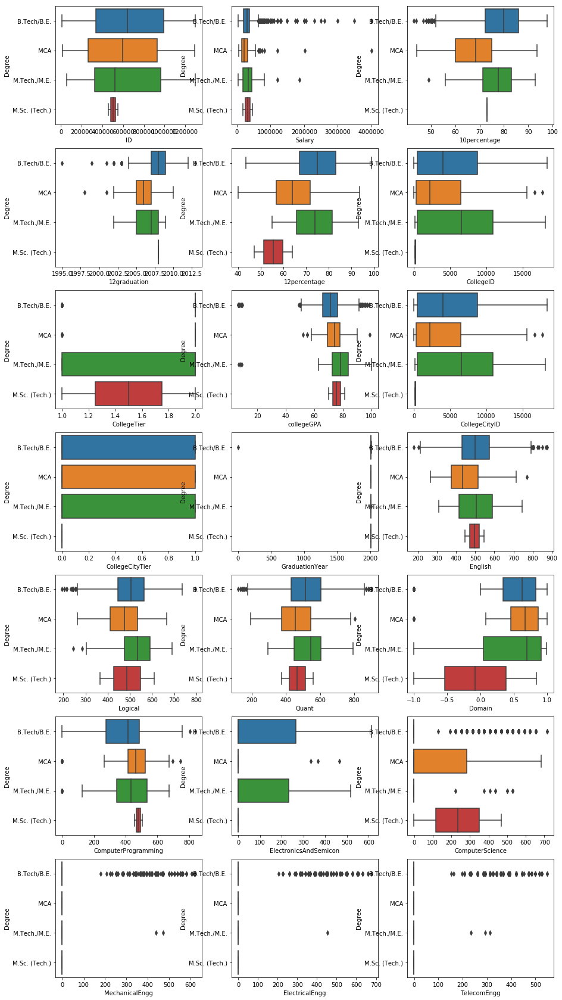

In [105]:
fig, ax = plt.subplots(7, 3, figsize=(15, 30))
for i, subplot in zip(numerical_column.columns, ax.flatten()):
    sns.boxplot(x=df[i],y=df['Degree'],ax=subplot)

#### Observation :- 

Their is good relation /pattern between Gender and ID, 10percentage, 12percentage ,12Graduation, collegeID, CollegeCityID, ComputerProgramming, ElectronicsAndSemicon.

Their is no relation / pattern between CollegeTier and numerical columns.

Their is good relation pattern between Degree and numerical columns

### Conclusion

1) In ID column their is no outliers but all the columns have some outliers

2) Acccording to pair plot there is some columns which have linear relationship beetween them but target variable is not perfectly correlated with any one columns.

3) As mentioned above there is to many columns which have highly positive correlations.

4) Degree/Gender and all the numerical columns have perfect pattern together in boxplot.

5) CollegeTier not make any pattern with numerical columns

# Perform feature transformation:

In [106]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


### Standardization of numerical column

In [107]:
from sklearn.preprocessing import StandardScaler

In [108]:
scaler = StandardScaler()

In [115]:
x = scaler.fit_transform(numerical_column)

C:\Users\vaibhav jangid\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\vaibhav jangid\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [117]:
x = pd.DataFrame(x,columns=numerical_column.columns)

In [118]:
x.head()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,-1.268535,0.527947,0.647233,-0.657765,1.939676,-0.836346,0.283282,0.797646,-0.836346,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.983466,0.707581,0.550939,1.512658,-0.304966
1,-0.230991,0.904045,0.758921,-0.657765,0.957729,0.135401,0.283282,-0.174641,0.135401,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.676367,0.246801,1.300083,0.060978,0.993910
2,0.404233,0.081332,0.718307,1.156686,-0.569744,-1.060644,0.283282,-0.181988,-1.060644,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.301041,1.661318,0.169167,-0.693995,0.803821
3,-1.091347,3.724775,0.779227,-0.657765,0.830439,0.367196,-3.530054,0.386200,0.367196,1.526071,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,0.081894,0.210589,-0.364495,-0.237001,-0.775129
4,-0.881871,-0.506320,0.007570,-0.052948,0.212176,1.293542,0.283282,0.295584,1.293542,-0.655278,...,-0.523491,-0.244363,-0.199587,-0.313347,-0.100503,-0.819775,-0.452174,-1.127304,0.258734,0.008542


### For Categorical column

In [119]:
z = df.select_dtypes(include='category')

In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 38 columns):
ID                       3998 non-null int64
Salary                   3998 non-null int64
DOJ                      3998 non-null datetime64[ns]
DOL                      3998 non-null object
Designation              3998 non-null object
JobCity                  3998 non-null object
Gender                   3998 non-null object
DOB                      3998 non-null datetime64[ns]
10percentage             3998 non-null float64
10board                  3998 non-null object
12graduation             3998 non-null int64
12percentage             3998 non-null float64
12board                  3998 non-null object
CollegeID                3998 non-null int64
CollegeTier              3998 non-null int64
Degree                   3998 non-null object
Specialization           3998 non-null object
collegeGPA               3998 non-null float64
CollegeCityID            3998 non-null int64
Colleg

In [122]:
cata = ['Designation','Gender','10board','12board','CollegeTier','Degree','Specialization','CollegeState']

In [124]:
df_cata = df[cata]

In [161]:
dummy_cols = pd.get_dummies(df_cata)

In [162]:
dummy_cols.head()

,CollegeTier,Designation_.net developer,Designation_.net web developer,Designation_account executive,Designation_account manager,Designation_admin assistant,Designation_administrative coordinator,Designation_administrative support,Designation_aircraft technician,Designation_android developer,...,CollegeState_Orissa,CollegeState_Punjab,CollegeState_Rajasthan,CollegeState_Sikkim,CollegeState_Tamil Nadu,CollegeState_Telangana,CollegeState_Union Territory,CollegeState_Uttar Pradesh,CollegeState_Uttarakhand,CollegeState_West Bengal
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
train,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [163]:
dummy_cols.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Columns: 1452 entries, CollegeTier to CollegeState_West Bengal
dtypes: int64(1), uint8(1451)
memory usage: 5.7+ MB


In [164]:
dummy_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
CollegeTier,3998.0,1.925713,0.262270,1.0,2.0,2.0,2.0,2.0
Designation_.net developer,3998.0,0.008504,0.091837,0.0,0.0,0.0,0.0,1.0
Designation_.net web developer,3998.0,0.001001,0.031619,0.0,0.0,0.0,0.0,1.0
Designation_account executive,3998.0,0.001001,0.031619,0.0,0.0,0.0,0.0,1.0
Designation_account manager,3998.0,0.000250,0.015815,0.0,0.0,0.0,0.0,1.0
Designation_admin assistant,3998.0,0.000500,0.022363,0.0,0.0,0.0,0.0,1.0
Designation_administrative coordinator,3998.0,0.000250,0.015815,0.0,0.0,0.0,0.0,1.0
Designation_administrative support,3998.0,0.000250,0.015815,0.0,0.0,0.0,0.0,1.0
Designation_aircraft technician,3998.0,0.000250,0.015815,0.0,0.0,0.0,0.0,1.0
Designation_android developer,3998.0,0.011506,0.106659,0.0,0.0,0.0,0.0,1.0


In [166]:
dummy_cols.head()

,CollegeTier,Designation_.net developer,Designation_.net web developer,Designation_account executive,Designation_account manager,Designation_admin assistant,Designation_administrative coordinator,Designation_administrative support,Designation_aircraft technician,Designation_android developer,...,CollegeState_Orissa,CollegeState_Punjab,CollegeState_Rajasthan,CollegeState_Sikkim,CollegeState_Tamil Nadu,CollegeState_Telangana,CollegeState_Union Territory,CollegeState_Uttar Pradesh,CollegeState_Uttarakhand,CollegeState_West Bengal
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
train,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [167]:
dummy_cols.tail()

,CollegeTier,Designation_.net developer,Designation_.net web developer,Designation_account executive,Designation_account manager,Designation_admin assistant,Designation_administrative coordinator,Designation_administrative support,Designation_aircraft technician,Designation_android developer,...,CollegeState_Orissa,CollegeState_Punjab,CollegeState_Rajasthan,CollegeState_Sikkim,CollegeState_Tamil Nadu,CollegeState_Telangana,CollegeState_Union Territory,CollegeState_Uttar Pradesh,CollegeState_Uttarakhand,CollegeState_West Bengal
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
train,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
